# Проектная работа: Рынок заведений общественного питания Москвы


**Описание проекта**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.


Для начала они просят меня — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постараемся сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций мы можете самостоятельно.


Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.


### Шаг 1. Загрузим данные и изучите общую информацию

In [1]:
#загрузим библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import warnings
warnings.filterwarnings("ignore")

In [2]:
#загрузим данные
try:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
except:
    data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
#Взглянем на начало таблицы
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Видим, что наименование столбцов уже в "привычном" формате.
Так же видим, что столбцы "имя", "адрес", "район" и "средний чек" написаны на киррилице и имеют большие буквы в сточках, что при обработке данных может помещать.

In [4]:
#переведем в нижний регистр все значения 
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
data['avg_bill'] = data['avg_bill'].str.lower()
data['district'] = data['district'].str.lower()

In [5]:
#посмотрим общую информацию
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
#количество уникальных названий заведений
data['name'].nunique()

5512

In [7]:
#уникальные категории
data.category.unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [8]:
data.district.unique()

array(['северный административный округ',
       'северо-восточный административный округ',
       'северо-западный административный округ',
       'западный административный округ',
       'центральный административный округ',
       'восточный административный округ',
       'юго-восточный административный округ',
       'южный административный округ',
       'юго-западный административный округ'], dtype=object)

**Вывод**

* Мы импортировали библиотеки
* Загрузили датафрейм
* Изучили общую информацию по датафрейму 
* Перевели столбецы с названиями, адресом, районом и средней стоимостью заказа в нижний регистр;

Посчитали количество уникальных названий заведений: в датасете у нас 5512 уникальных заведений.
Столбцы name, category, address, district, hours, price и avg_bill имеют подходящий тип данных object, так как они описывают информацию о заведении;

Столбцы lat, lng, rating, middle_avg_bill, middle_coffee_cup имеют подходящий тип данных float, так как значения в этих столбцах выражаются рациональными числами;

Столбец chain имеет подходящий тип данных int, так как выражается целыми чилами;

СТолбцу seats больше подходит тип данных int, так как количество сидячих мест нем ожет быть дробным.

### Шаг 2. Выполним предобработку данных



In [9]:
#явные дубликаты
data.duplicated().sum()

0

Явных дубликатов нет, уже легче

Поимщем неявные дубликаты

In [10]:
data.duplicated(subset = ['name', 'address']).sum()

4

4 неявных дубликата. Принимаем решение их удалить.

In [11]:
data = data.drop_duplicates(subset = ['name', 'address'])

In [12]:
#теперь займемся пропусками
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

Видим очень много пропусков. При этом просто удалить их не получиться. 

**Попробуем их заполнить:**

* пропуски в hours, seats правильно заполнить не удастся, так как это индивидуальные данные для каждого заведения.

* толбец price в разных административных округах имеет разное значение, и заполять пропуски в соответствии со значениями в столбце middle_avg_bill будем не самым удачным решением.

* значения в столбце avg_bill распределены по столбцам middle_avg_bill и middle_coffee_cup.

**Вывод:**
оставить пропуски как есть с указанием что данные не совсем полные.

In [13]:
#Создадим столбец street с названиями улиц из столбца с адресом.
data['street'] = data['address'].str.split(',').str[1]

In [14]:
#Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
data['is_24_7'] = data['hours'] == 'ежедневно, круглосуточно'

In [15]:
#Проверяем
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


**Вывод:**

* Нашли и удалили дубликаты
* Посчтитали пропуски. Приняли решение с ними не чего не делать.
* Создали столбец street с названиями улиц из столбца с адресом.
* Создали столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

### Шаг 3. Анализ данных

#### Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации.

In [16]:
category_temp = data['category'].value_counts().reset_index()
category_temp = category_temp.rename(columns={'index': 'category', 'category': 'count'})
category_temp

,category,count
0,кафе,2376
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


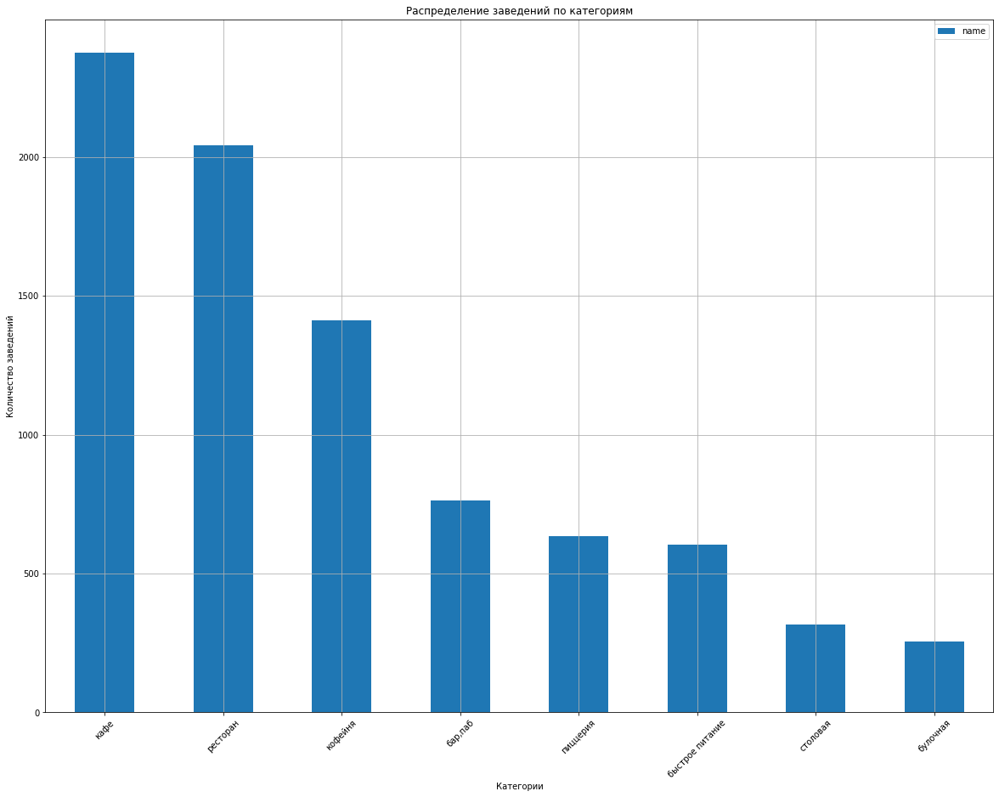

In [17]:
category_count = data.pivot_table(index = 'category', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False)
category_count.plot(kind = 'bar', figsize=(20, 15))
plt.title('Распределение заведений по категориям')
plt.ylabel('Количество заведений')
plt.xlabel('Категории')
plt.xticks(rotation = 45)
plt.grid()
plt.show()

**Вывод:** больше всего в Москве объектов общественного питания категории "кафе". На втором месте - рестораны, на третьем - кофейни.

#### Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации.

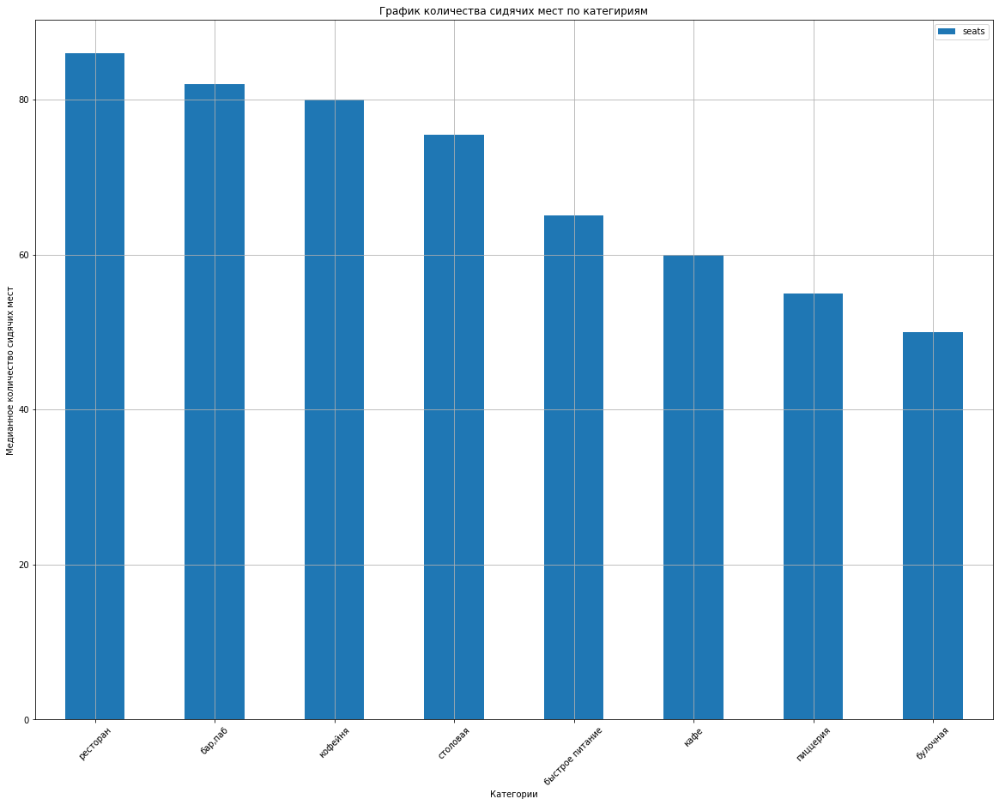

In [18]:
#будем считать по медианному значению что бы исключить выбросы
data.pivot_table(index = 'category', values = 'seats', aggfunc = 'median').sort_values(by = 'seats', ascending = False).plot(kind = 'bar', figsize=(20, 15))
plt.title('График количества сидячих мест по категириям')
plt.ylabel('Медианное количество сидячих мест')
plt.xlabel('Категории')
plt.xticks(rotation = 45)
plt.grid()
plt.show()

**Вывод:** наибольшее медианное количество посадочных мест - в ресторанах, барах и кофейнях (80-90) и столовых (75). Меньше посадочных мест в заведениях быстрого питания, кафе и пиццериях (55-65), а меньше всего - в булочных (50).

####  Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

In [19]:
#для удобства заменим в 0 и 1 на "несетевые" и "сетевые" соответственно
data['chain'] = data['chain'].replace(0, 'несетевые')
data['chain'] = data['chain'].replace(1, 'сетевые')

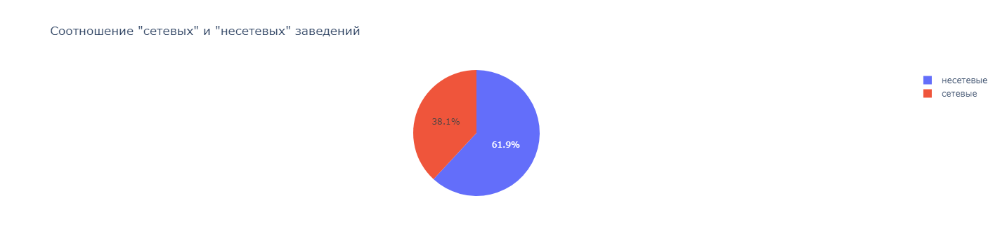

In [20]:
chain = data.pivot_table(index = 'chain', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
chain.columns = ['chain', 'count']
fig = go.Figure(data=[go.Pie(labels=chain['chain'], values=chain['count'])])
fig.update_layout(title='Соотношение "сетевых" и "несетевых" заведений')
fig.show()

**Вывод:** большая часть заведений общественного питания - несетевые (62 %), сетевых заведений 38 %.

#### Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [21]:
chain_temp = data.query('chain == "сетевые"').pivot_table(index = 'category', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False)
chain_temp_m = category_count.merge(chain_temp, how='left', on='category').reset_index()
chain_temp_m.columns = ['category', 'count', 'chain']
chain_temp_m['percent'] = round(chain_temp_m['chain']/chain_temp_m['count']*100, 1)
chain_temp_m

,category,count,chain,percent
0,кафе,2376,779,32.8
1,ресторан,2042,729,35.7
2,кофейня,1413,720,51.0
3,"бар,паб",764,168,22.0
4,пиццерия,633,330,52.1
5,быстрое питание,603,232,38.5
6,столовая,315,88,27.9
7,булочная,256,157,61.3


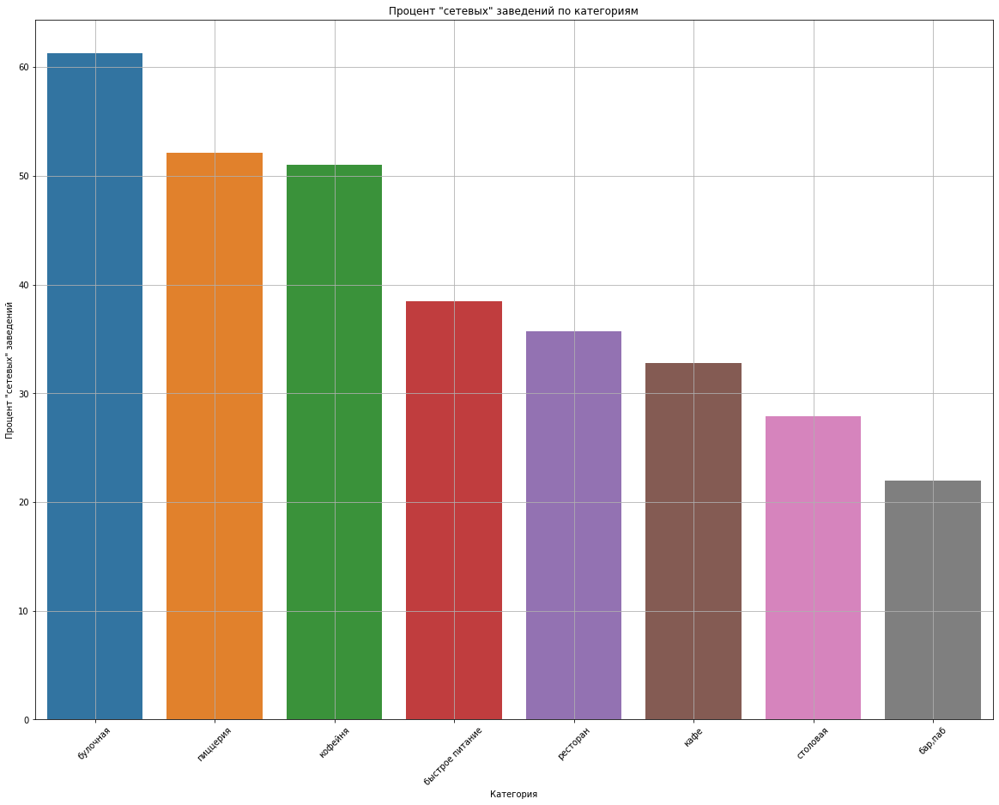

In [22]:
plt.figure(figsize=(20, 15))
sns.barplot(x='category', 
            y='percent', 
            data=chain_temp_m.sort_values(by = 'percent', ascending = False))
plt.title('Процент "сетевых" заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Процент "сетевых" заведений')
plt.xticks(rotation=45)
plt.grid()
plt.show()

**Вывод:** мы можем увидеть, что доля сетевых заведений больше всего у булочных, пиццерий и кофеен, меньше всего у баров и столовых.

####  Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве.

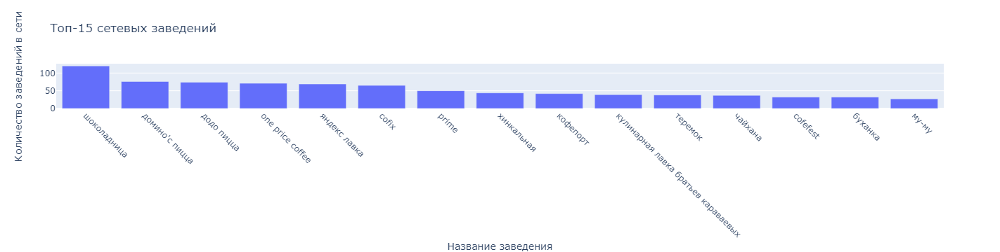

In [23]:
top_15 = data.query('chain == "сетевые"').pivot_table(index = 'name', values = 'chain', aggfunc = 'count').sort_values(by = 'chain', ascending = False).reset_index().head(15)
fig = px.bar(top_15, x='name', y='chain', title='Топ-15 сетевых заведений')
fig.update_layout(xaxis_title='Название заведения',
                  yaxis_title='Количество заведений в сети')
fig.update_xaxes(tickangle=45)
fig.show()

Самая многочисленная сеть общественного питания в Москве - кофейня "Шоколадница". На втором и третьем местах - пиццерии "Домино'с Пицца" и "Додо Пицца".

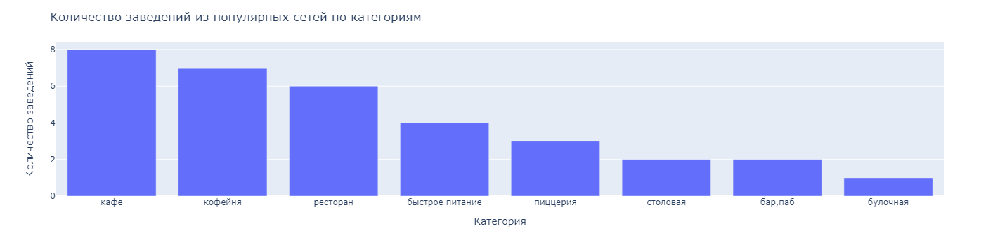

In [24]:
top_15_name = top_15['name']
top_15_category = data.query('name in @top_15_name').pivot_table(index = 'category', values = 'name', aggfunc = 'nunique').reset_index()
fig = px.bar(top_15_category, 
             x='category', 
             y='name')
fig.update_layout(title='Количество заведений из популярных сетей по категориям',
                  xaxis_title='Категория',
                  yaxis_title='Количество заведений',
                  xaxis={'categoryorder':'total descending'})
fig.show()

**Ожидаемо:** наибольшее число сетевых заведений состаяляют кофейни, рестораны и кафе.

#### Отобразим общее количество заведений и количество заведений каждой категории по районам.

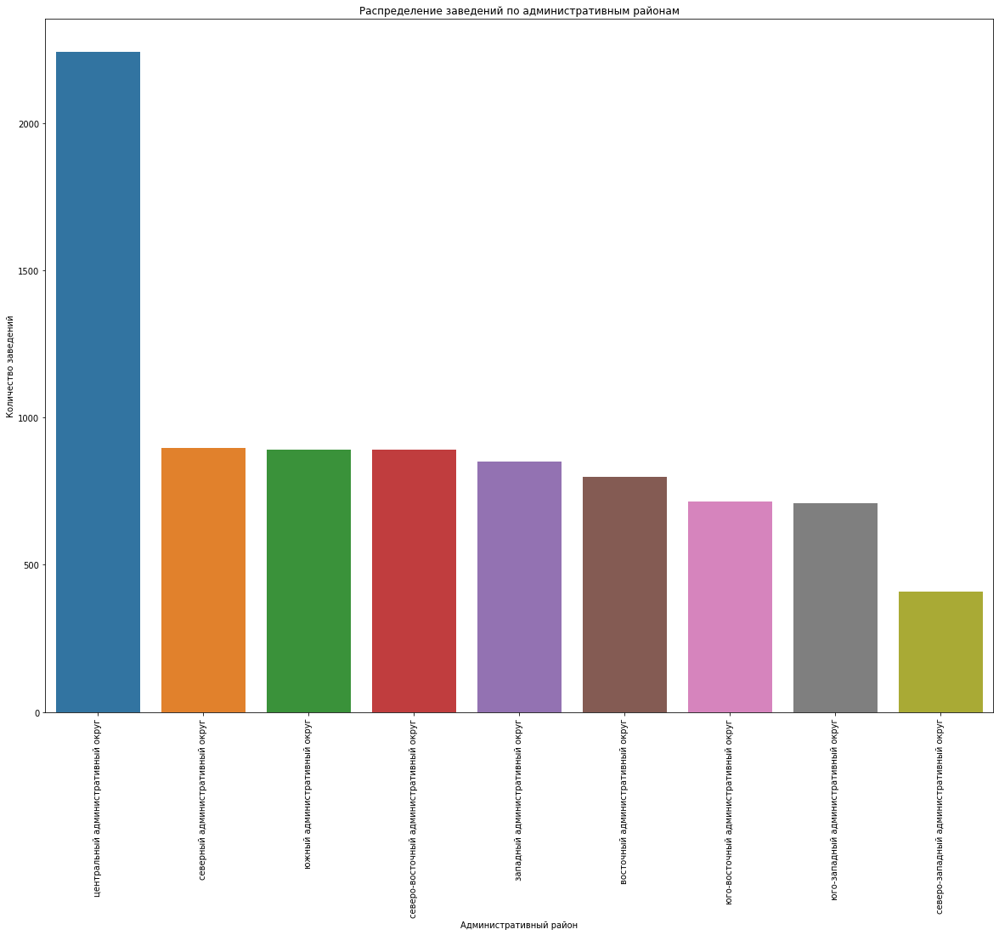

In [25]:
# построим распределение заведений по административным районам без разделения по категориям
district_temp = data.pivot_table(index = 'district', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
plt.figure(figsize=(20, 15))
sns.barplot(x = 'district', y = 'name', data = district_temp)
plt.title('Распределение заведений по административным районам')
plt.xlabel('Административный район')
plt.ylabel('Количество заведений')
plt.xticks(rotation = 90)
plt.show()

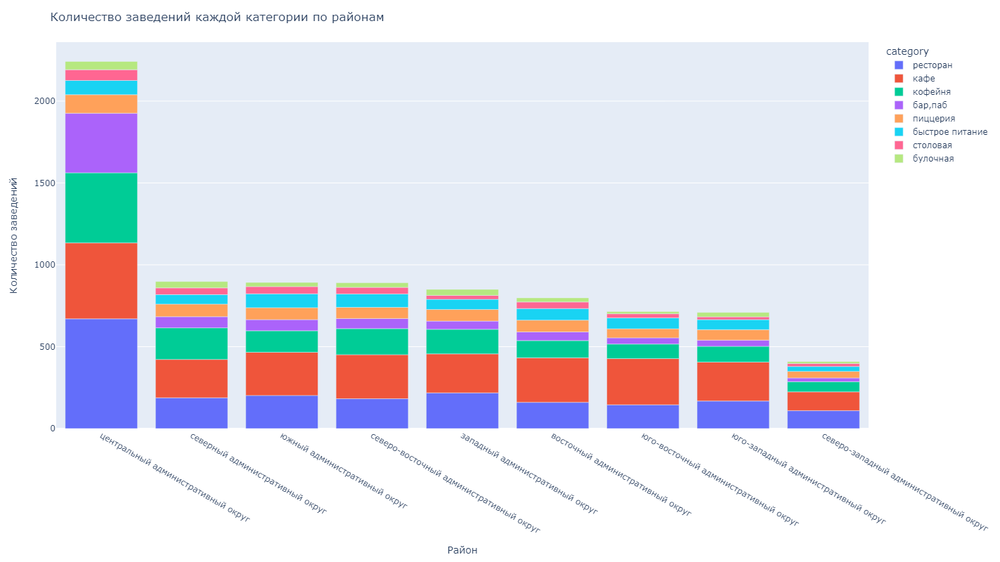

In [26]:
#разделим их на категории
district_per_category = data.groupby(['district', 'category']).agg(count=('category', 'count')).reset_index()
fig = px.bar(district_per_category.sort_values(by='count', ascending=False), 
             x='district', 
             y='count', 
             color='category')
fig.update_layout(title='Количество заведений каждой категории по районам',
                  xaxis_title='Район',
                  yaxis_title='Количество заведений',
                  height=800,
                  width=1000,
                  xaxis={'categoryorder':'total descending'})
fig.show()

**Вывод:**

Больше всего заведений общественного питания находится в Центральном административном округе. Более чем в 2-3 раза меньше заведений в других округах. Меньше всего заведений в Северо-Западном округе.

В Центральном администативном округе большую часть заведений составляют рестораны, затем следуют кафе, кофейни и бары. В других округах большую часть заведений составляют кафе.

#### Визуализируем распределение средних рейтингов по категориям заведений.

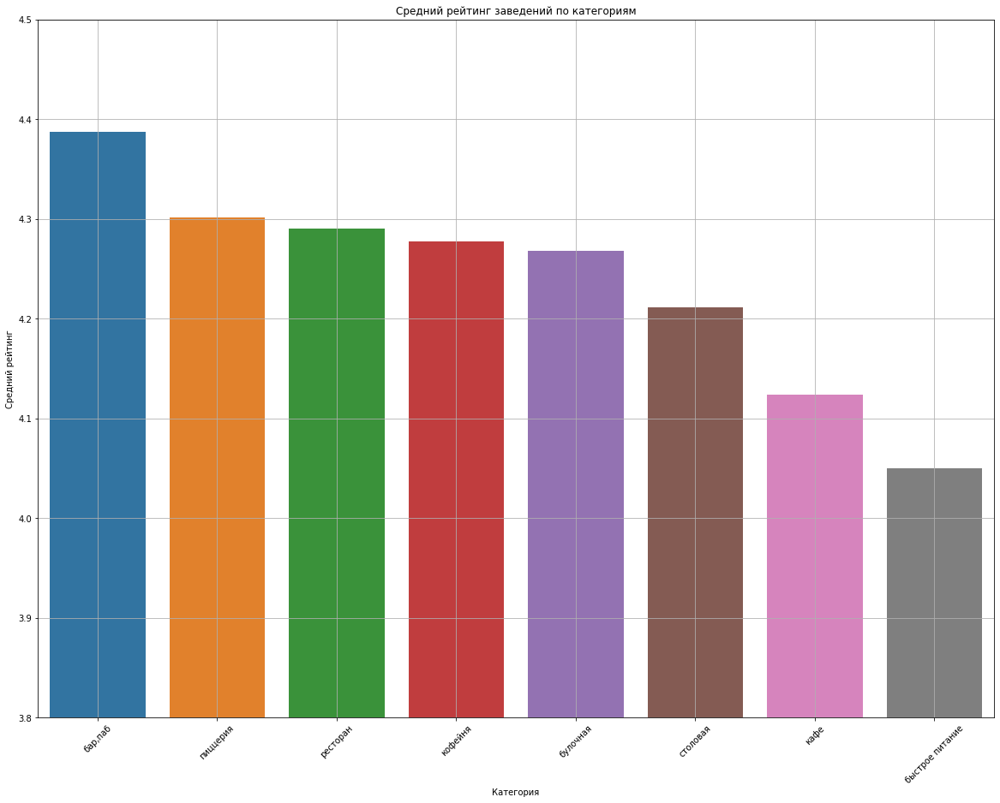

In [27]:
ratings_temp = data.groupby('category').agg(mean_rating=('rating', 'mean')).sort_values(by='mean_rating', ascending=False).reset_index()
plt.figure(figsize=(20, 15))
sns.barplot(x='category', y='mean_rating', data=ratings_temp) 
plt.title('Средний рейтинг заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation=45)
plt.ylim(3.8, 4.5)
plt.grid()
plt.show()

**Вывод:** Самый высокий средний рейтинг - у заведений категории "бар, паб"(около 4.4). На втором месте пиццерии(чуть выше 4.3). На третьем месте рестораны(чуть ниже 4.3). Худший рейтинг у заведений быстрого питания(около 4.05).

#### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [28]:
dist_ratings = data.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by = 'rating', ascending = False)
dist_ratings

,district,rating
5,центральный административный округ,4.377520
2,северный административный округ,4.240980
4,северо-западный административный округ,4.208802
8,южный административный округ,4.184417
1,западный административный округ,4.181647
0,восточный административный округ,4.174185
7,юго-западный административный округ,4.172920
3,северо-восточный административный округ,4.147978
6,юго-восточный административный округ,4.101120


In [29]:
# загружаем JSON-файл с границами округов Москвы
state_geo =  'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=  'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson',
    data=dist_ratings,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод:** Самый высокий средний рейтинг - у заведений Центрального административного округа (около 4.38). Самые низкие средние рейтинги - у заведений Северо-Восточного и Юго-Восточного административных округов (4.1). У заведений остальных округов средний рейтинг составил 4.24.

#### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [30]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

#### Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.

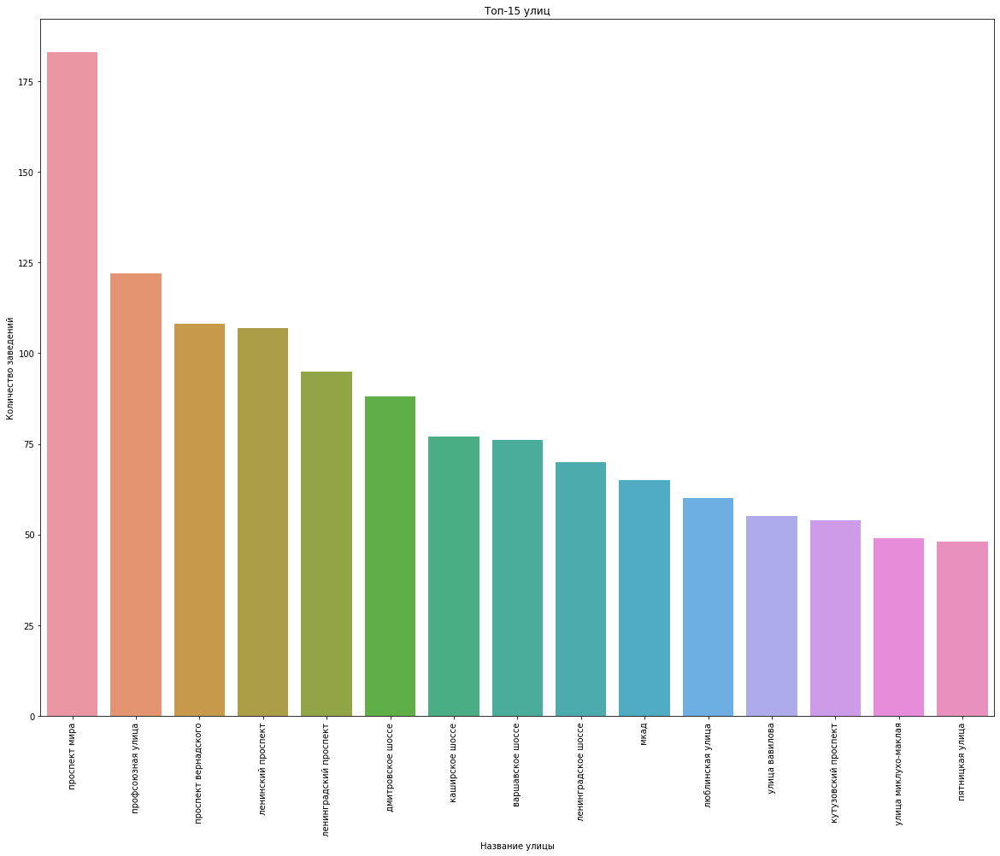

In [31]:
#для начала найдем топ 15 улиц по количеству заведений без деления по категориям
top_15_street = data.pivot_table(index = 'street', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index().head(15)
plt.figure(figsize=(20, 15))
sns.barplot(x = 'street', y = 'name', data = top_15_street)
plt.title('Топ-15 улиц')
plt.xlabel('Название улицы')
plt.ylabel('Количество заведений')
plt.xticks(rotation = 90)
plt.show()

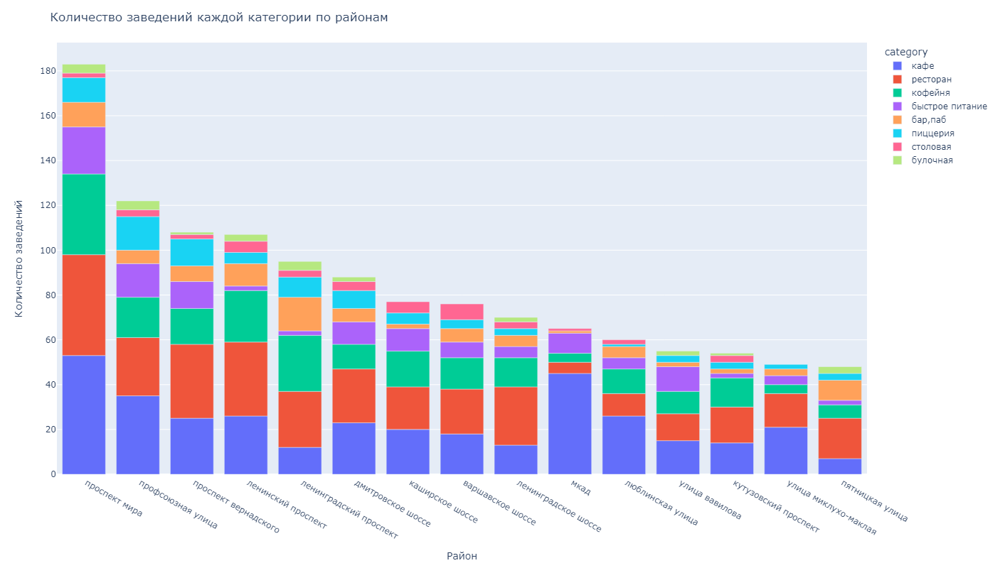

In [32]:
#запишем топ улицы в переменную street
street = top_15_street['street']
#теперь можно делить на категории
street_per_category = data.query("street in @street").groupby(['street', 'category']).agg(count=('category', 'count')).reset_index()
fig = px.bar(street_per_category.sort_values(by='count', ascending=False), 
             x='street', 
             y='count', 
             color='category')
fig.update_layout(title='Количество заведений каждой категории по районам',
                  xaxis_title='Район',
                  yaxis_title='Количество заведений',
                  height=800,
                  width=1000,
                  xaxis={'categoryorder':'total descending'})
fig.show()

**Вывод:** 

Больше всего заведений находится на проспекте Мира. Из них большую часть составляют кафе и рестораны, затем идут кофейни. Большую часть заведений на популярных улицах составляют преимущественно кафе и рестораны примерно в равных долях. На МКАД огромное количество кафе.

#### Найдем улицы, на которых находится только один объект общепита.

In [33]:
one_place = data.pivot_table(index = 'street', values = 'name', aggfunc = 'count').query("name == 1").reset_index()
only_one_street = one_place['street']
df_only_one_street = data.query("street in @only_one_street")
df_only_one_street

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,средний счёт:300–500 ₽,400.0,NaN,несетевые,180.0,улица бусиновская горка,False
21,7/12,кафе,"москва, прибрежный проезд, 7",северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,несетевые,NaN,прибрежный проезд,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,сетевые,NaN,парк левобережный,False
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",северо-восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,средний счёт:500–800 ₽,650.0,NaN,сетевые,NaN,угличская улица,False
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",северо-восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,сетевые,NaN,ландшафтный заказник лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,мираж,ресторан,"москва, улица шкулёва, 2а",юго-восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,несетевые,90.0,улица шкулёва,False
8294,wtfcoffee,кофейня,"москва, улица артюхиной, 14/8с1",юго-восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,несетевые,NaN,улица артюхиной,False
8317,беседка,кафе,"москва, кузьминская улица, 10",юго-восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,сетевые,NaN,кузьминская улица,False
8379,лагман хаус,кафе,"москва, новороссийская улица, 14, стр. 2",юго-восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,сетевые,40.0,новороссийская улица,False


457 заведений. Посмотрим как распределяются категории этих заведений.

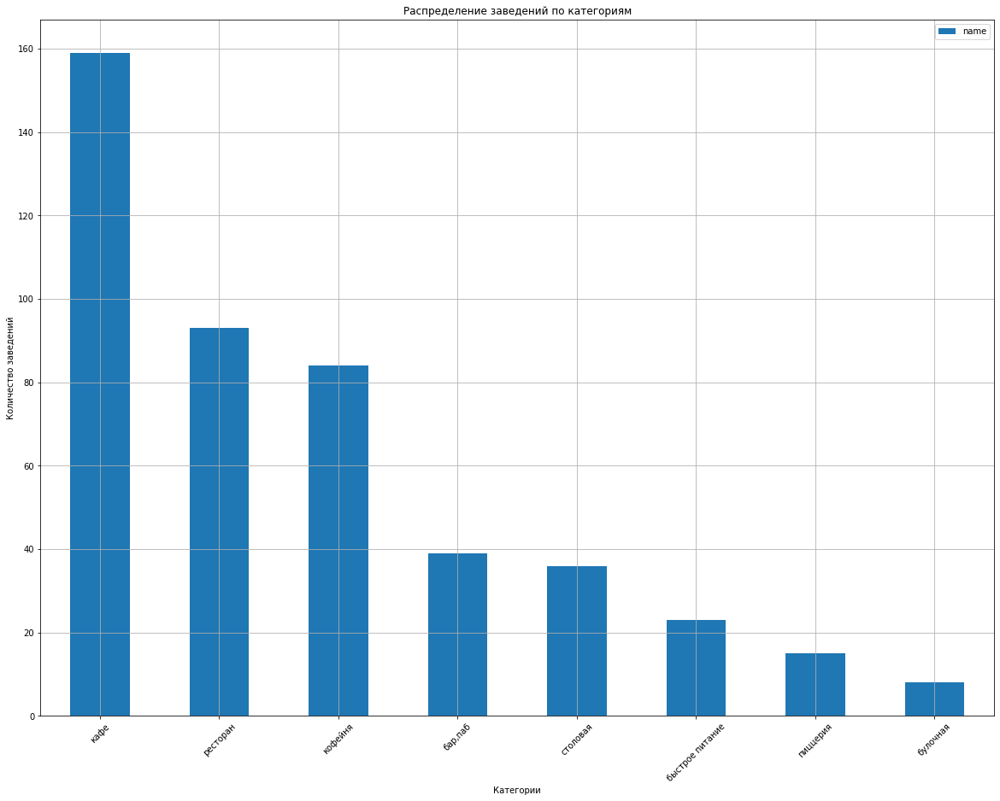

In [34]:
df_only_one_street.pivot_table(index = 'category', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).plot(kind = 'bar', figsize=(20, 15))
plt.title('Распределение заведений по категориям')
plt.ylabel('Количество заведений')
plt.xlabel('Категории')
plt.xticks(rotation = 45)
plt.grid()
plt.show()

По категориям, здесь, в основном, кафе. Посмотрим как распределяются по административным районам.

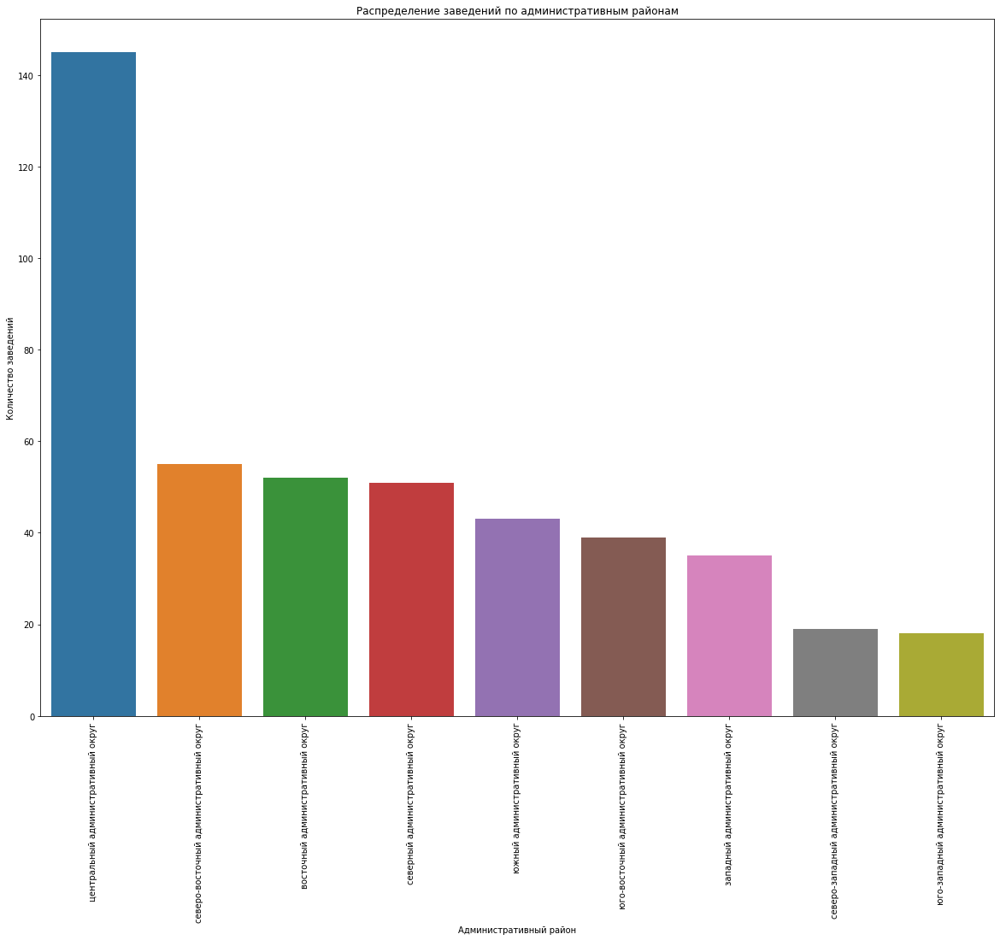

In [35]:
dist_only_one = df_only_one_street.pivot_table(index = 'district', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
plt.figure(figsize=(20, 15))
sns.barplot(x = 'district', y = 'name', data = dist_only_one)
plt.title('Распределение заведений по административным районам')
plt.xlabel('Административный район')
plt.ylabel('Количество заведений')
plt.xticks(rotation = 90)
plt.show()

Больше всего в таких заведений в Центральном административном округе. Узнаем, сколько из них "сетевых" и "несетевых" завденений?

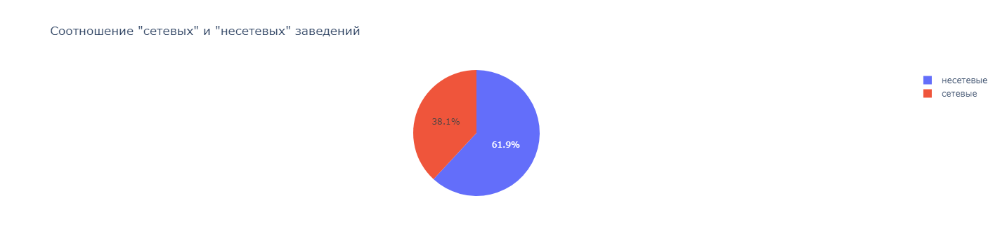

In [36]:
chain_only_one = data.pivot_table(index = 'chain', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
chain_only_one.columns = ['chain', 'count']
fig = go.Figure(data=[go.Pie(labels=chain_only_one['chain'], values=chain_only_one['count'])])
fig.update_layout(title='Соотношение "сетевых" и "несетевых" заведений')
fig.show()

#### Посчитайте медиану столбца middle_avg_bill для каждого района. Будем использовать это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других.

In [37]:
dist_mid_avg_bill = data.groupby('district').agg(median_middle_avg_bill=('middle_avg_bill', 'median')).sort_values(by='median_middle_avg_bill', ascending=False).reset_index()
dist_mid_avg_bill

,district,median_middle_avg_bill
0,западный административный округ,1000.0
1,центральный административный округ,1000.0
2,северо-западный административный округ,700.0
3,северный административный округ,650.0
4,юго-западный административный округ,600.0
5,восточный административный округ,575.0
6,северо-восточный административный округ,500.0
7,южный административный округ,500.0
8,юго-восточный административный округ,450.0


In [38]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dist_mid_avg_bill,
    columns=['district', 'median_middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод:** Самые высокие средние чеки - в заведениях общественного питания Центрально и Западного административных округов (1000 руб.), самый низкий - в Юго-Восточном административном округе (450 руб.). В остальных округах средние чеки составляют от 500 до 700 руб. Таким образом, удалённость от центра влияет на величину среднего чека не во всех округах Москвы.

#### Общий вывод

* Больше всего в Москве объектов общественного питания категории "кафе". На втором месте - рестораны, на третьем - кофейни;

* Наибольшее медианное количество посадочных мест - в ресторанах, барах и кофейнях (80-90) и столовых (75). Меньше посадочных мест в заведениях быстрого питания, кафе и пиццериях (55-65), а меньше всего - в булочных (50);

* Большая часть заведений общественного питания - несетевые (62 %), сетевых заведений 38 %;

* Булочные(62%), пиццерии(52%), кофейни(51%) чаще являются сетевыми. "Несетевым" лидером являются бары(78%);

* Самая многочисленная сеть общественного питания в Москве - кофейня "Шоколадница". На втором и третьем местах - пиццерии "Домино'с Пицца" и "Додо Пицца". Наибольшее число сетевых заведений состаяляют кофейни, рестораны, пиццерии и кафе;

* Больше всего заведений общественного питания находится в Центральном административном округе. Более чем в 2-3 раза меньше заведений в других округах. Меньше всего заведений в Северо-Западном округе. В Центральном администативном округе большую часть заведений составляют рестораны, затем следуют кафе, кофейни и бары. В других округах большую часть заведений составляют кафе;

* Самый высокий средний рейтинг - у заведений категории "бар, паб"(около 4.4). На втором месте пиццерии(чуть выше 4.3). На третьем месте рестораны(чуть ниже 4.3). Худший рейтинг у заведений быстрого питания(около 4.05);

* Самый высокий средний рейтинг - у заведений Центрального административного округа (около 4.38). Самые низкие средние рейтинги - у заведений Северо-Восточного и Юго-Восточного административных округов (4.1). У заведений остальных округов средний рейтинг составил 4.24;

* Больше всего заведений находится на проспекте Мира. Из них большую часть составляют кафе и рестораны, затем идут кофейни. Большую часть заведений на популярных улицах составляют преимущественно кафе и рестораны примерно в равных долях. На МКАД огромное количество кафе.

* Улиц, на которых один объект общепита 457. По категориям большую часть занимают кафе. Больше всего таких заведений в Центральном административном округе. "Сетевых" 38.1%, "несетевых" 61.9%

* Самые высокие средние чеки - в заведениях общественного питания Центрально и Западного административных округов (1000 руб.), самый низкий - в Юго-Восточном административном округе (450 руб.). В остальных округах средние чеки составляют от 500 до 700 руб. Таким образом, удалённость от центра влияет на величину среднего чека не во всех округах Москвы.

### Шаг 4. Детализируем исследование: открытие кофейни

#### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?


In [39]:
coffee = data.query("category == 'кофейня'")
coffee

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,несетевые,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,сетевые,NaN,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,сетевые,46.0,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,сетевые,NaN,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,сетевые,NaN,улица дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"москва, люблинская улица, 61",юго-восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,несетевые,NaN,люблинская улица,False
8365,квадрат кофе,кофейня,"москва, волгоградский проспект, 73, стр. 1",юго-восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,цена чашки капучино:100–220 ₽,NaN,160.0,несетевые,206.0,волгоградский проспект,False
8376,шоколад имбирь корица,кофейня,"москва, грайвороновская улица, 23",юго-восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,несетевые,NaN,грайвороновская улица,False
8385,cafio,кофейня,"москва, новохохловская улица, 49",юго-восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,цена чашки капучино:80–120 ₽,NaN,100.0,несетевые,NaN,новохохловская улица,False


1413 кофеен в датафрейме

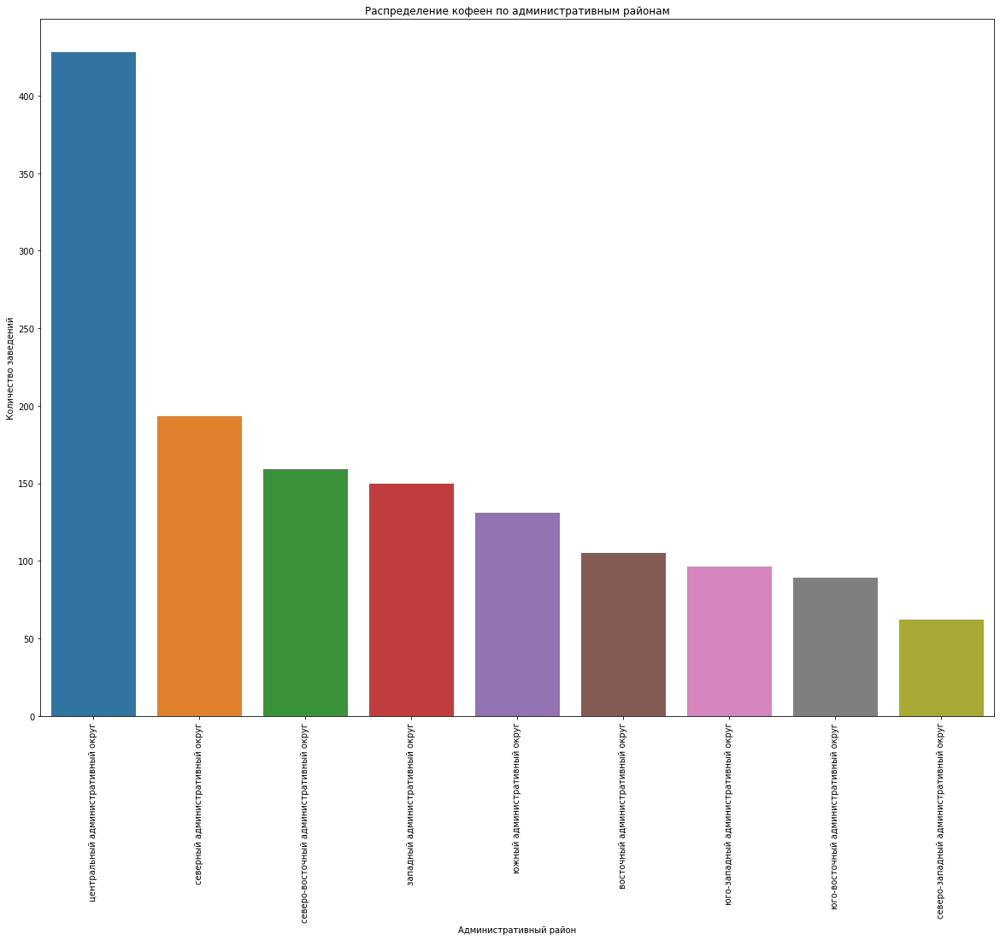

In [40]:
#посмотрим на распределение кафеен по администратиным районам.
dist_coffee = coffee.pivot_table(index = 'district', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
plt.figure(figsize=(20, 15))
sns.barplot(x = 'district', y = 'name', data = dist_coffee)
plt.title('Распределение кофеен по административным районам')
plt.xlabel('Административный район')
plt.ylabel('Количество заведений')
plt.xticks(rotation = 90)
plt.show()

In [41]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dist_coffee,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(m)

# выводим карту
m

Большая часть кофеен находится в Центральном округе (30 %). От 10 до 14 % кофеен - в Северном, Северо-Восточном и Западном округах. В остальных районах от 4 до 9 % кофеен.

#### Есть ли круглосуточные кофейни?

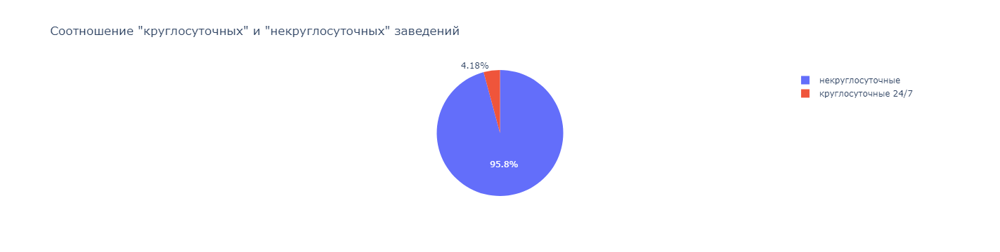

In [42]:
coffee['is_24_7'] = coffee['is_24_7'].replace(True, 'круглосуточные 24/7')
coffee['is_24_7'] = coffee['is_24_7'].replace(False, 'некруглосуточные')
is_24_7 = coffee.pivot_table(index = 'is_24_7', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
is_24_7.columns = ['is_24_7', 'count']
fig = go.Figure(data=[go.Pie(labels=is_24_7['is_24_7'], values=is_24_7['count'])])
fig.update_layout(title='Соотношение "круглосуточных" и "некруглосуточных" заведений')
fig.show()

Лишь 4.18% кофеен являются круглосуточными 24/7

#### Какие у кофеен рейтинги? Как они распределяются по районам?

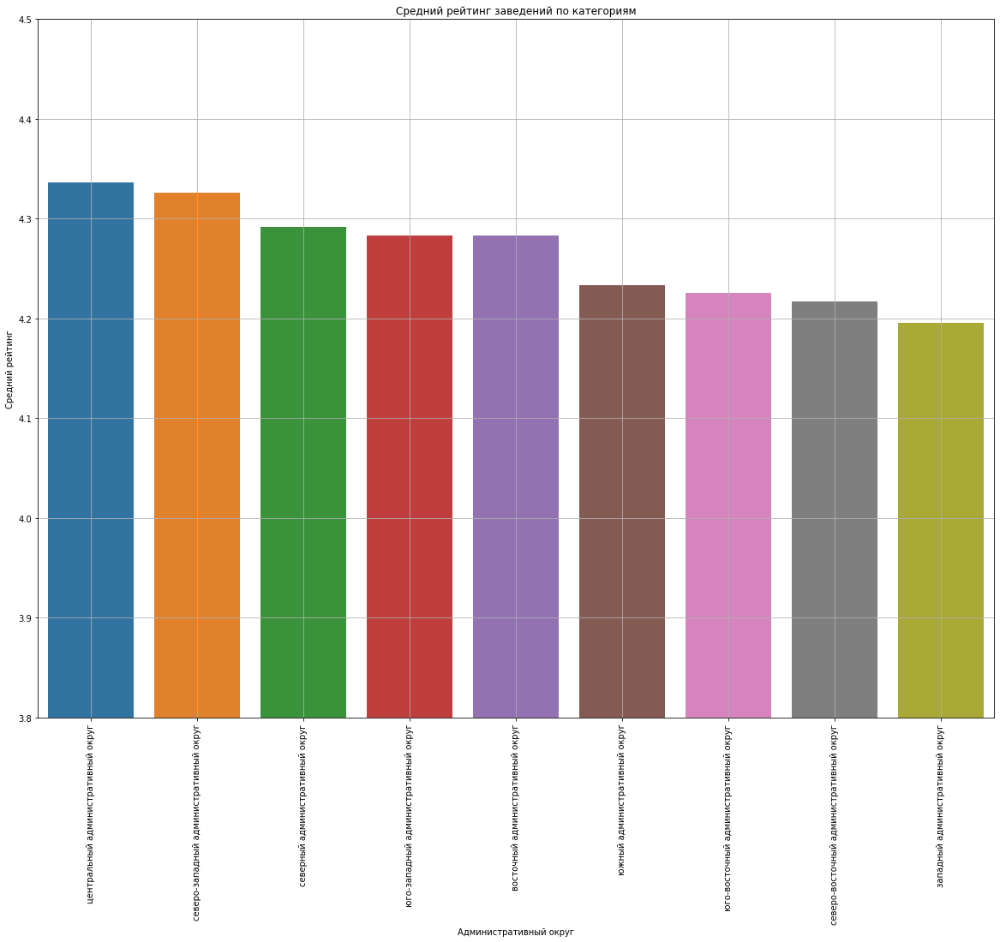

In [43]:
#посмотрим на рейтенги кофеен в административных районах
dist_coffee_rating = coffee.groupby('district').agg(mean_rating=('rating', 'mean')).sort_values(by='mean_rating', ascending=False).reset_index()
plt.figure(figsize=(20, 15))
sns.barplot(x='district', y='mean_rating', data=dist_coffee_rating) 
plt.title('Средний рейтинг заведений по категориям')
plt.xlabel('Административный округ')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation=90)
plt.ylim(3.8, 4.5)
plt.grid()
plt.show()

Самый высокий средний рейтинг в Центральном административном округе и Северо-Западном административном округе(выше 4.3). Самый низкий средний рейтинг в Западном административном округе (ниже 4.2).

#### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

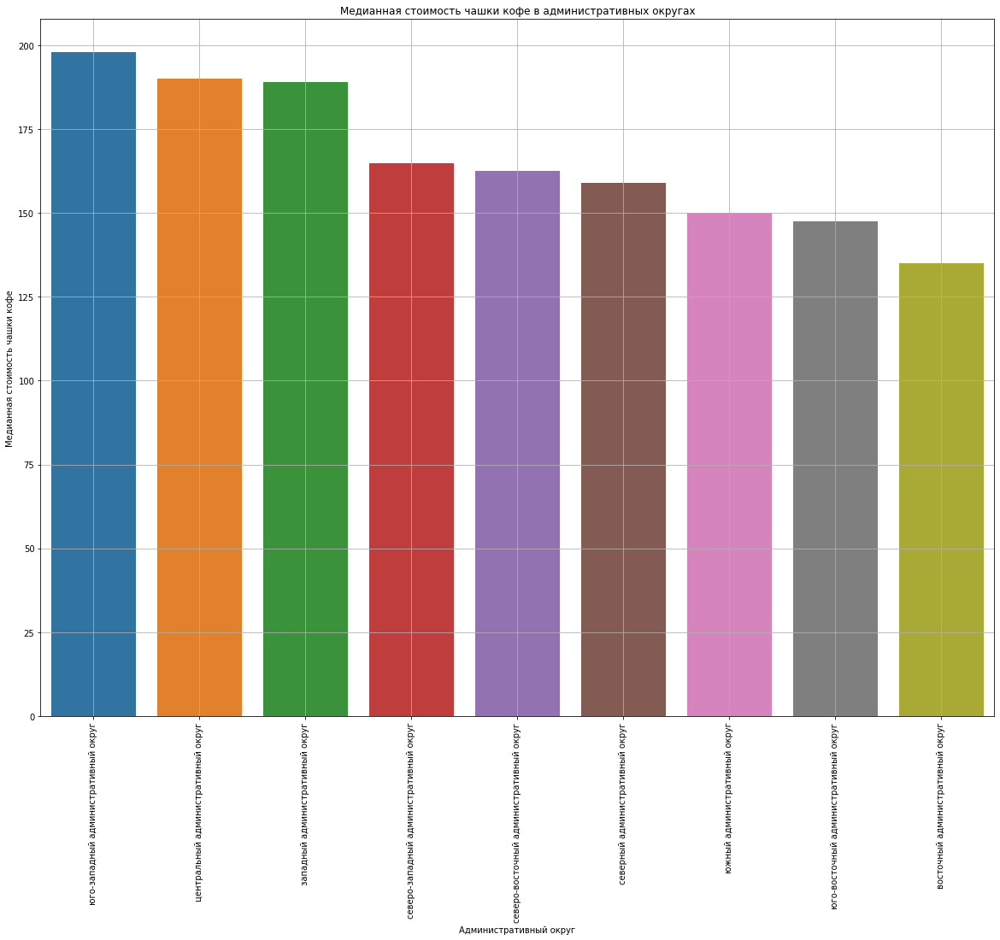

In [44]:
coffee_cup_mid = coffee.pivot_table(index = 'district', values = 'middle_coffee_cup', aggfunc = 'median').sort_values(by = 'middle_coffee_cup', ascending = False).reset_index()
plt.figure(figsize=(20, 15))
sns.barplot(x='district', y='middle_coffee_cup', data=coffee_cup_mid) 
plt.title('Медианная стоимость чашки кофе в административных округах')
plt.xlabel('Административный округ')
plt.ylabel('Медианная стоимость чашки кофе')
plt.xticks(rotation=90)
plt.grid()
plt.show()

Самая высокая стоимость в Юго-Западном, Центральном и Западном административных округах(175-200 руб). Самая низкая стоимость в Восточном административном округе(125-150 рублей).

#### Вывод

Рекомендуется открывать кофейню в Юго-Западном административном округе, так как там низкое количество кофеен и самые дорогие цены на чашку кофе. Если открыть кофейню в более низкими, конкурентными ценами на чашку кофе, можно привлечь множество клиентов. Лучше всего открывать кофейню возле мест высокой проходимости, например, метро, либо возле учебных заведений, офисов.

### Шаг 5. Призентация

Ссылка на призентацию: https://disk.yandex.ru/d/6nMuIMzTnJJPtw

### Шаг 6. Выводы

Мы завершили проектную работу  на тему "Рынок заведений общественного питания Москвы"


Рассматривая вопрос об открытии кофейни в Москве можно сдать следующие рекомендации:

* Кофеен в Москве достаточно много. По количественным показателям занимает 3 место среди всех категорий (1413/16.8%) Поэтому стоит выбирать менее конкурентные места расположения точек.
* Округами, в которых как раз конкуренции меньше - ЮВАО, ЮЗАО, СЗАО.
* Количество круглосуточных кофеен составляет всего 4,18% от общего числа кофеен. 

Стоит обдумать возможность круглосуточной работы. Западный и Юго-Западный округа являются дефицитными регионами в плане круглосуточных заведений. В Центральном округе будет лучше воспользоваться форматом 24/7, так как это самый оживленный район с большим количеством пешеходных улиц и оживлен в темное время суток. Кроме того, на западных округах наблюдается низкий рейтинг заведений, что может быть использовано как преимущество при запуске.

* Стоит отметить, что в вышеперечисленных районах с малым количеством кофеен (ЮВАО, ЮЗАО, СЗАО) достаточно неплохое распределение среднего рейтинга кафе.
* В среднем цена чашки кофе составляет до 200 рублей. В разных округах цена немного варируется. Например дороже кофе продают в центре и на западе столицы. Дешевле всего кофе разливают на востоке и юго-востоке Москвы.
* Касаемо распределения посадочных мест, медианы по округам рознятся от 50 до 96 посадочных мест.